imports

In [1]:
import re 
# Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
pd.set_option("display.max_rows", None,"display.max_columns", None)
warnings.simplefilter(action='ignore')
plt.style.use('seaborn')

# Algorithmes
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from mlxtend.plotting import plot_confusion_matrix
from IPython.display import Image

import stylecloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mati\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\mati\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


data collection (WELFake Dataset)

In [2]:
df=pd.read_csv("dataset.csv")
df.head()

,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


In [3]:
df.shape

(72134, 4)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72134 entries, 0 to 72133
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  72134 non-null  int64 
 1   title       71576 non-null  object
 2   text        72095 non-null  object
 3   label       72134 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 2.2+ MB


In [5]:
def check(df):
    l=[]
    columns = df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df)

,column,dtypes,nunique,sum_null
0,Unnamed: 0,int64,72134,0
1,title,object,62347,558
2,text,object,62718,39
3,label,int64,2,0


In [6]:
df.drop(columns=['Unnamed: 0'],inplace=True)

In [7]:
def check(df):
    l=[]
    columns = df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df)

,column,dtypes,nunique,sum_null
0,title,object,62347,558
1,text,object,62718,39
2,label,int64,2,0


In [8]:
df.dropna(inplace=True)

In [9]:
df.duplicated().sum()

8416

In [10]:
#delete duplicate rows
df.drop_duplicates(inplace=True)

In [11]:
df.head

<bound method NDFrame.head of                                                    title  \
0      LAW ENFORCEMENT ON HIGH ALERT Following Threat...   
2      UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...   
3      Bobby Jindal, raised Hindu, uses story of Chri...   
4      SATAN 2: Russia unvelis an image of its terrif...   
5      About Time! Christian Group Sues Amazon and SP...   
6      DR BEN CARSON TARGETED BY THE IRS: “I never ha...   
7      HOUSE INTEL CHAIR On Trump-Russia Fake Story: ...   
8      Sports Bar Owner Bans NFL Games…Will Show Only...   
9      Latest Pipeline Leak Underscores Dangers Of Da...   
10      GOP Senator Just Smacked Down The Most Puncha...   
11     May Brexit offer would hurt, cost EU citizens ...   
12     Schumer calls on Trump to appoint official to ...   
13     WATCH: HILARIOUS AD Calls Into Question Health...   
14     No Change Expected for ESPN Political Agenda D...   
15     Billionaire Odebrecht in Brazil scandal releas...   
16     BRI

EDA

In [12]:
# df['label'] = df['label'].replace({0: 'Fake', 1: 'Real'})

[Text(0, 0, '0'), Text(1, 0, '1')]

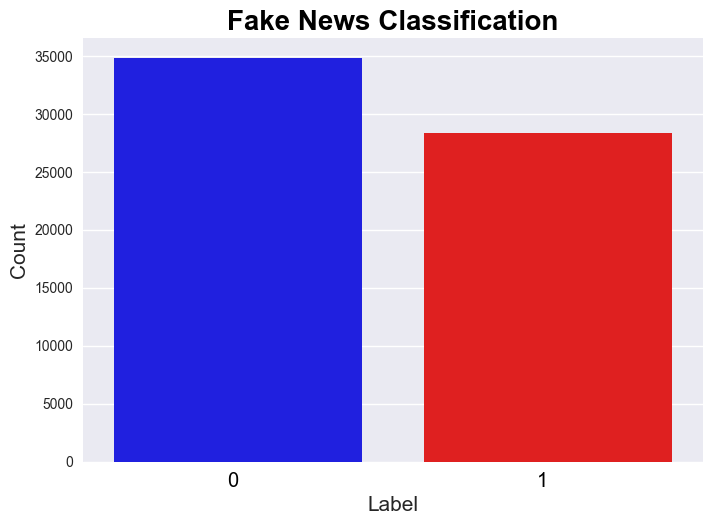

In [13]:
chart = sns.countplot(x='label', data=df, palette=['blue', 'red'])
plt.title('Fake News Classification', fontsize=20, fontweight='bold', color='black')
plt.xlabel('Label', fontsize=15), 
plt.ylabel('Count', fontsize=15)
chart.set_xticklabels(chart.get_xticklabels(), horizontalalignment='right', fontweight='light', fontsize='x-large', color='black')

feature engineering

In [14]:
df['txt']=df['title']+' '+df['text']
df.drop(columns=['title','text'],inplace=True)


Decided to limit the dataset to 20k rows

In [15]:
min_df = df.sample(20000).reset_index(drop='index')

In [16]:
min_df.head()

,label,txt
0,0,"Trump, Clinton meet again at 'humorous' Al Smi..."
1,1,Corker Has Last Word On Day Care Donnie: ‘On ...
2,1,WATCH: Whoopi Goldberg And Joy Behar WRECK Re...
3,1,‘Alien Megastructure’ Star Targeted by $100 Mi...
4,1,Muhammad Ali’s Son Detained At Airport Becaus...


In [17]:
tl = WordNetLemmatizer()
corpus = []
for i in np.arange(len(min_df)):
    result =re.sub(r'[^a-zA-Z]',' ',min_df.iloc[i]['txt'])
    result=result.lower()
    result=result.split()
    result=[tl.lemmatize(word) for word in result if word not in stopwords.words('english')]
    result=" ".join(result)
    corpus.append(result)

In [18]:
x = np.array(corpus)
y = np.array(min_df['label'])

In [19]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=24, shuffle= True)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((16000,), (4000,), (16000,), (4000,))

In [20]:
tfidf = TfidfVectorizer(max_features=5000, ngram_range=(1,3))

In [21]:
# fit the vectorizer and transform X_train into a tf-idf matrix,
# then use the same vectorizer to transform X_test

x_train = tfidf.fit_transform(x_train).toarray()
x_test = tfidf.transform(x_test).toarray()

Modelling

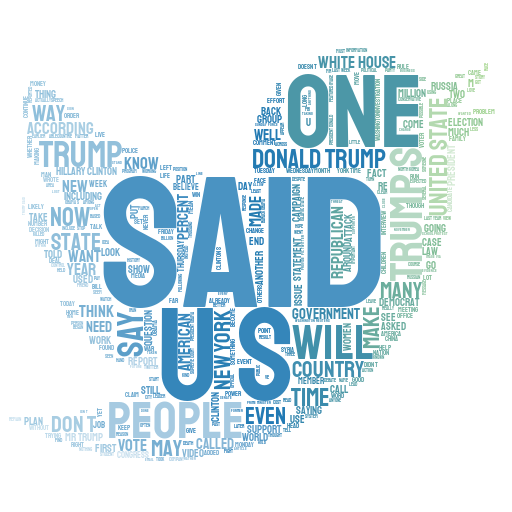

In [22]:
stylecloud.gen_stylecloud(text=" ".join(min_df['txt']), 
                          icon_name='fab fa-twitter',
                          palette='colorbrewer.qualitative.Paired_3', 
                          background_color='white',
                          gradient='horizontal')
Image('stylecloud.png')

Wordcloud

In [23]:
from wordcloud import WordCloud

Fake News titles

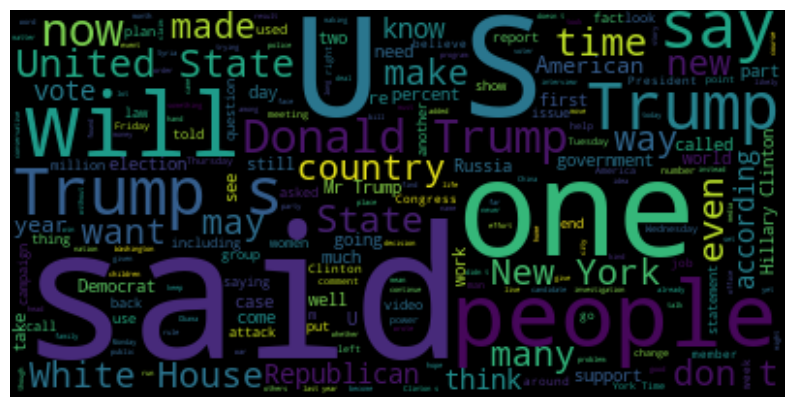

In [24]:
#Generate a word cloud image for the text in the dataframe 
wordcloud = WordCloud().generate(" ".join(min_df['txt']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Real News titles

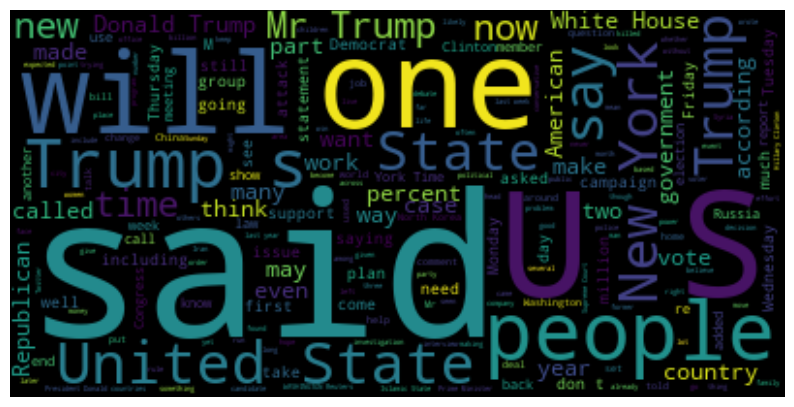

In [25]:
#Create a word cloud image for the titles of the fake news
wc = WordCloud().generate(min_df.groupby('label')['txt'].sum()[0])
plt.figure(figsize=(10,10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

matplotlib

In [26]:
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

SweetViz

In [27]:
import sweetviz as sv

# Summary of the dataset
analysis = sv.analyze(min_df)
analysis.show_html('EDA-FAKENEWSCLASSIFICATION-Sweetviz.html', open_browser=False)

#Dislay resuls in the notebook
import IPython
ip = IPython.display.IFrame(src='EDA-Matti-Sweetviz.html', width=1000, height=600)


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:01 -> (00:00 left)


Report EDA-FAKENEWSCLASSIFICATION-Sweetviz.html was generated.


Comparison report

In [28]:
#comparison report between train and test sets for sweetviz
report = sv.compare([min_df, "Train"], [min_df, "Test"], "label")
report.show_html('Compare-FAKENEWSCLASSIFICATION-Sweetviz.html', open_browser=False)

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:00 -> (00:00 left)


Report Compare-FAKENEWSCLASSIFICATION-Sweetviz.html was generated.


Histograms

array([[<AxesSubplot:title={'center':'label'}>]], dtype=object)

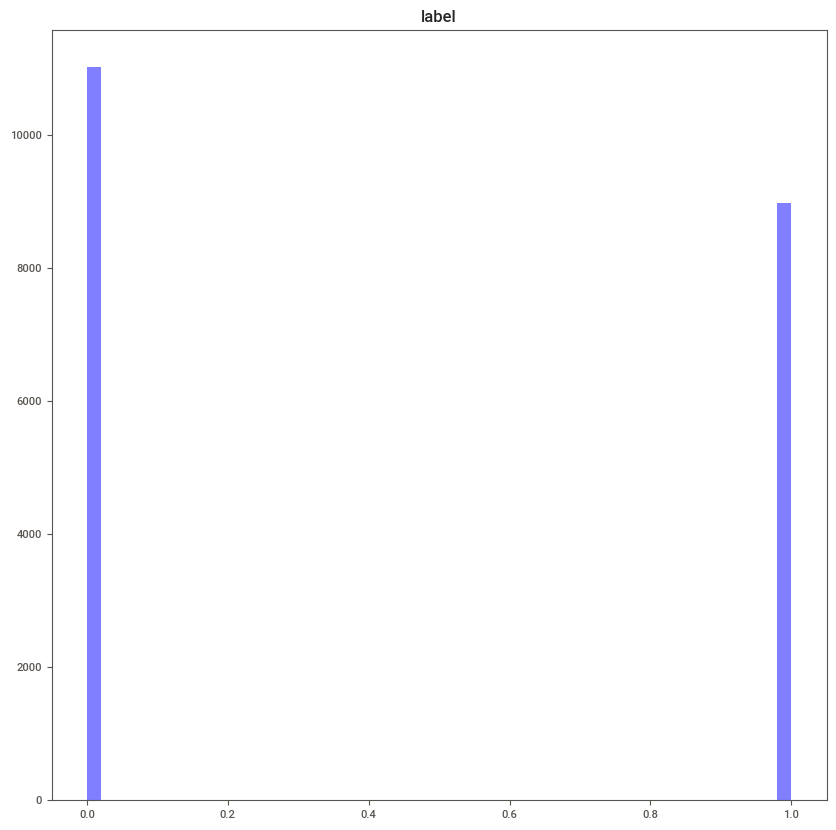

In [29]:
# df.hist(column=['label'], figsize=(10,10), color='blue', alpha=0.5, bins=50, grid=False)

# for i in df.columns:
#     print(f'{i}')
#     plt.hist(df[i])
#     plt.tight_layout()
#     plt.show()

#histogram of the dataset
min_df.hist(figsize=(10,10), color='blue', alpha=0.5, bins=50, grid=False)


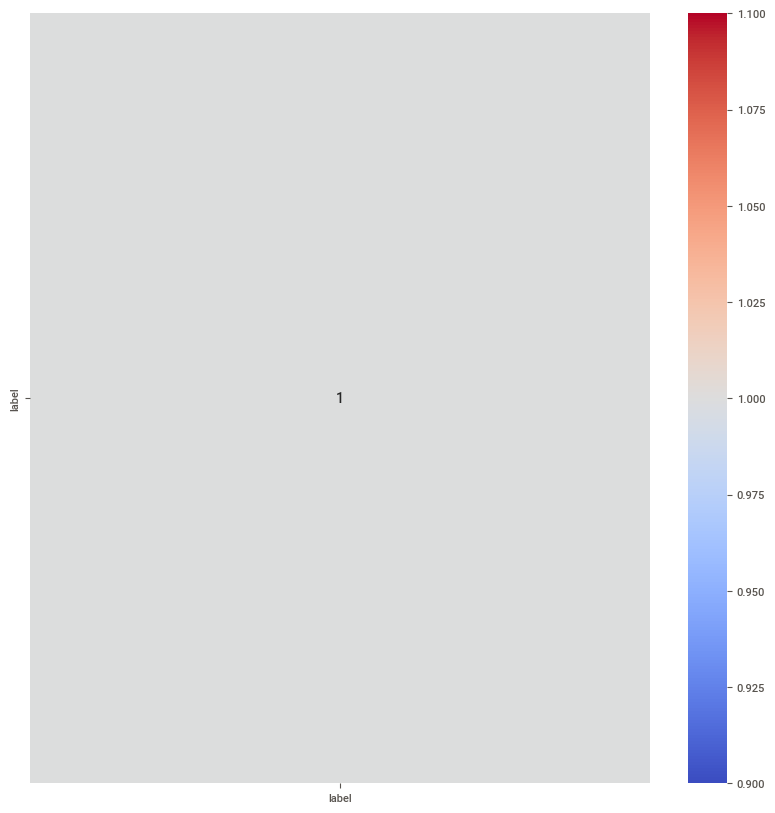

In [30]:
#Heatmap
plt.figure(figsize=(10,10))
sns.heatmap(min_df.corr(), annot=True, cmap='coolwarm')
plt.show()

In [31]:
#pairplot
sns.pairplot(min_df['label'], hue='label', palette='coolwarm')
plt.show()

TypeError: 'data' must be pandas DataFrame object, not: <class 'pandas.core.series.Series'>

No handles with labels found to put in legend.


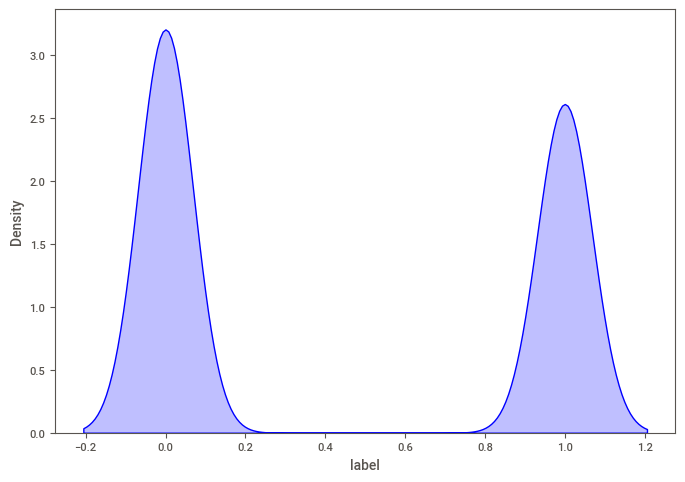

In [32]:
# for column in df.columns:
#     df[column].plot.kde(label=column)
#     plt.legend()
#     plt.show

#kdeplot
sns.kdeplot(min_df['label'], shade=True, color='blue')
plt.legend()
plt.show()

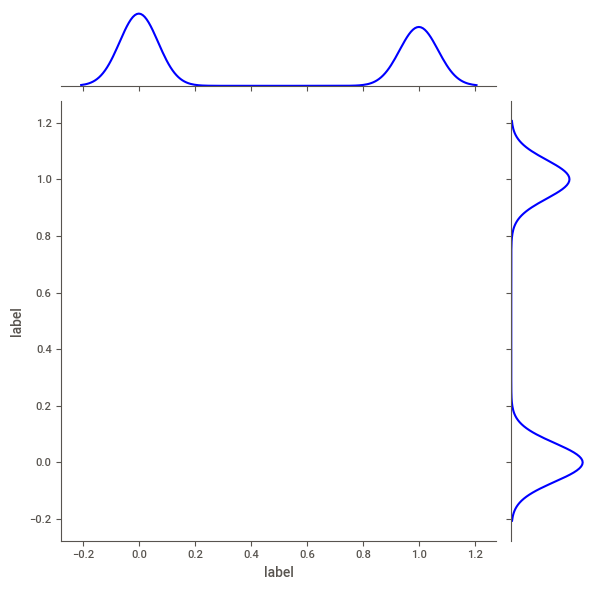

In [33]:
#EventCollection
sns.jointplot(x='label', y='label', data=min_df, kind='kde', color='blue')
plt.show()

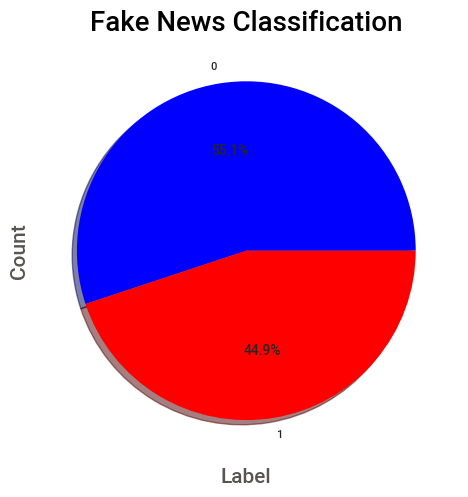

In [34]:
#Piechart
min_df['label'].value_counts().plot.pie(autopct='%1.1f%%', shadow=True, colors=['blue', 'red'])
plt.title('Fake News Classification', fontsize=20, fontweight='bold', color='black')
plt.xlabel('Label', fontsize=15),
plt.ylabel('Count', fontsize=15)
plt.show()

In [35]:
train_score = []
test_score = []
CV = []

def algorithm(model):
    #training model
    model.fit(x_train, y_train)
    
    #score of training model
    train_model_score = model.score(x_train, y_train)
    train_score.append(round(train_model_score, 2))
    y_pred_train = model.predict(x_train)
    
    #score of test set
    test_model_score = model.score(x_test, y_test)
    test_score.append(round(test_model_score, 2))
    y_pred_test = model.predict(x_test)
    
    #train set using cross validation
    cross_val = cross_val_score(model, x_train, y_train, cv=10)
    cv_mean = cross_val.mean()
    CV.append(round(cv_mean, 2))
    
    #printing values
    print('Train set score: ', train_model_score)
    print('Test set score: ', test_model_score)
    print('Cross validation score: ', cv_mean)
    
    df_model = pd.DataFrame(classification_report(y_pred_test,y_test, digits=2,output_dict=True)).T
    df_model['support'] = df_model.support.apply(int)
    df_model.style.background_gradient(cmap='viridis',subset=pd.IndexSlice['0':'9', :'f1-score'])
    display(df_model)
    
    print('Confusion Matrix')
    conf_mat = confusion_matrix(y_pred_test, y_test)
    plot_confusion_matrix(conf_mat, figsize=(8,8), hide_ticks=True, cmap=plt.cm.Blues, show_normed=True, colorbar=True, class_names=['Fake','Real'])
    
    plt.show()

GaussianNb

Train set score:  0.8726875
Test set score:  0.83875
Cross validation score:  0.8509375


,precision,recall,f1-score,support
0,0.823053,0.878846,0.850035,2080
1,0.858347,0.795312,0.825629,1920
accuracy,0.838750,0.838750,0.838750,0
macro avg,0.840700,0.837079,0.837832,4000
weighted avg,0.839994,0.838750,0.838320,4000


Confusion Matrix


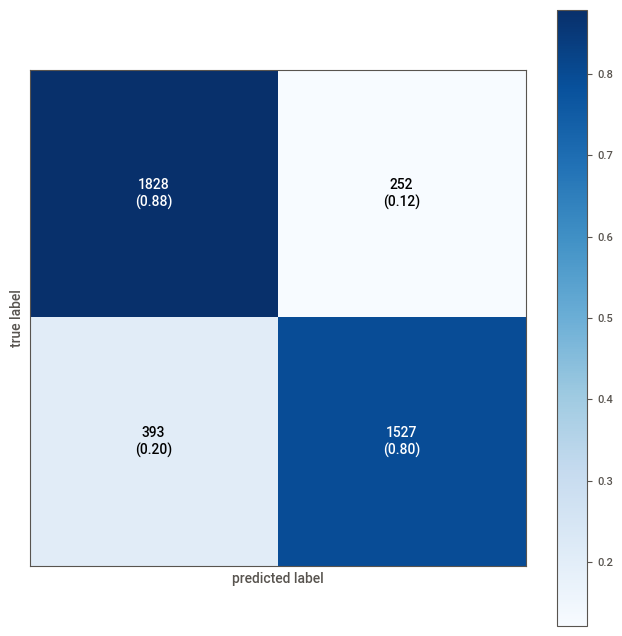

In [36]:
gnv = GaussianNB()
algorithm(gnv)

BernoulliNB

Train set score:  0.8463125
Test set score:  0.8265
Cross validation score:  0.8418750000000002


,precision,recall,f1-score,support
0,0.789284,0.885801,0.834762,1979
1,0.872962,0.768431,0.817368,2021
accuracy,0.826500,0.826500,0.826500,0
macro avg,0.831123,0.827116,0.826065,4000
weighted avg,0.831563,0.826500,0.825974,4000


Confusion Matrix


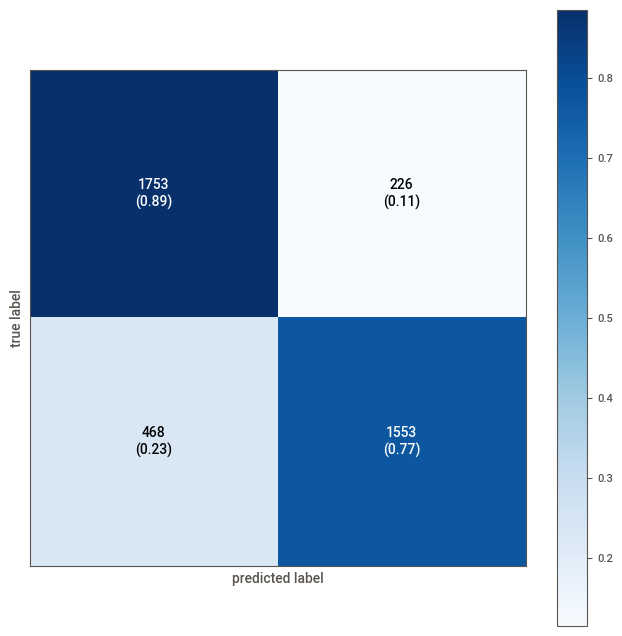

In [37]:
bnv = BernoulliNB()
algorithm(bnv)

MLPClassifier

Train set score:  0.9999375
Test set score:  0.92525
Cross validation score:  0.9306249999999998


,precision,recall,f1-score,support
0,0.934264,0.931329,0.932794,2228
1,0.913997,0.917607,0.915798,1772
accuracy,0.925250,0.925250,0.925250,0
macro avg,0.924130,0.924468,0.924296,4000
weighted avg,0.925285,0.925250,0.925265,4000


Confusion Matrix


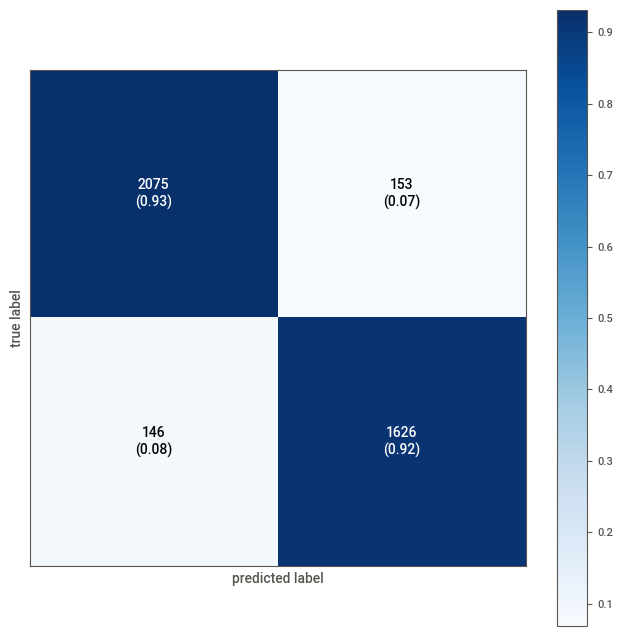

In [38]:
mlp = MLPClassifier()
algorithm(mlp)

RandomForest

Train set score:  1.0
Test set score:  0.9365
Cross validation score:  0.9411874999999998


,precision,recall,f1-score,support
0,0.953624,0.933451,0.943430,2269
1,0.915121,0.940497,0.927635,1731
accuracy,0.936500,0.936500,0.936500,0
macro avg,0.934373,0.936974,0.935533,4000
weighted avg,0.936962,0.936500,0.936595,4000


Confusion Matrix


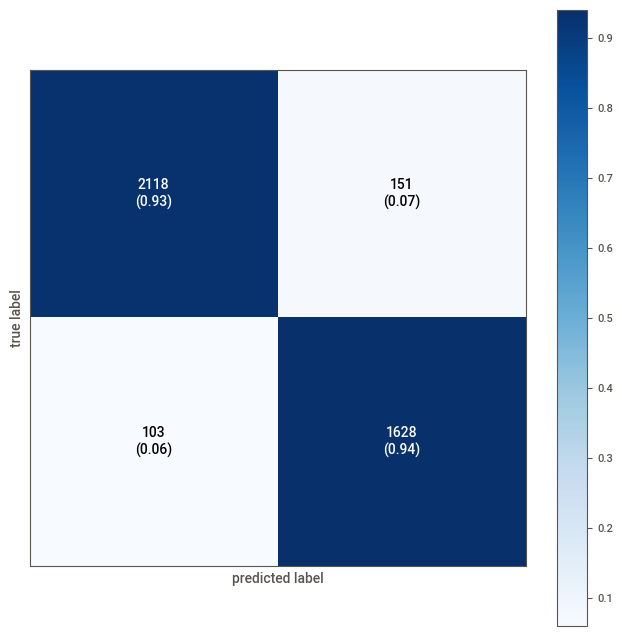

In [39]:
rf = RandomForestClassifier()
algorithm(rf)

XGBoost

Train set score:  0.9985
Test set score:  0.95375
Cross validation score:  0.9588750000000001


,precision,recall,f1-score,support
0,0.954075,0.962307,0.958173,2202
1,0.953345,0.943270,0.948281,1798
accuracy,0.953750,0.953750,0.953750,0
macro avg,0.953710,0.952789,0.953227,4000
weighted avg,0.953747,0.953750,0.953727,4000


Confusion Matrix


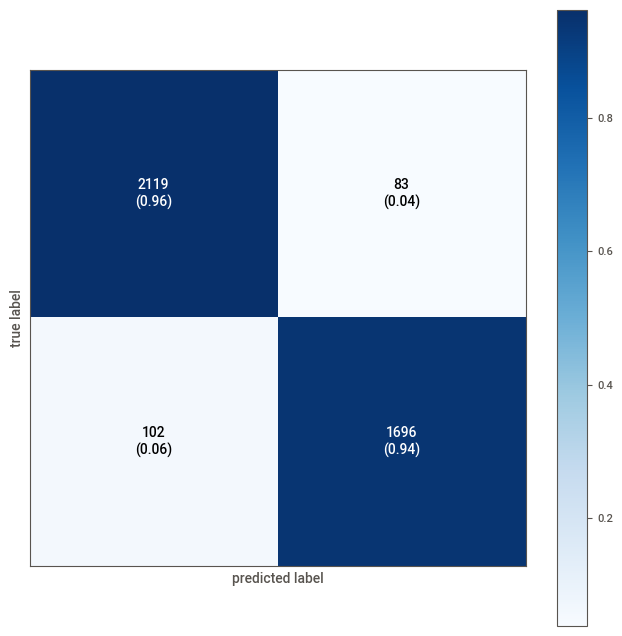

In [40]:
xgb = XGBClassifier()
algorithm(xgb)

SVM

Train set score:  0.99375
Test set score:  0.9365
Cross validation score:  0.9459375


,precision,recall,f1-score,support
0,0.945520,0.940439,0.942973,2233
1,0.925239,0.931522,0.928370,1767
accuracy,0.936500,0.936500,0.936500,0
macro avg,0.935379,0.935981,0.935671,4000
weighted avg,0.936561,0.936500,0.936522,4000


Confusion Matrix


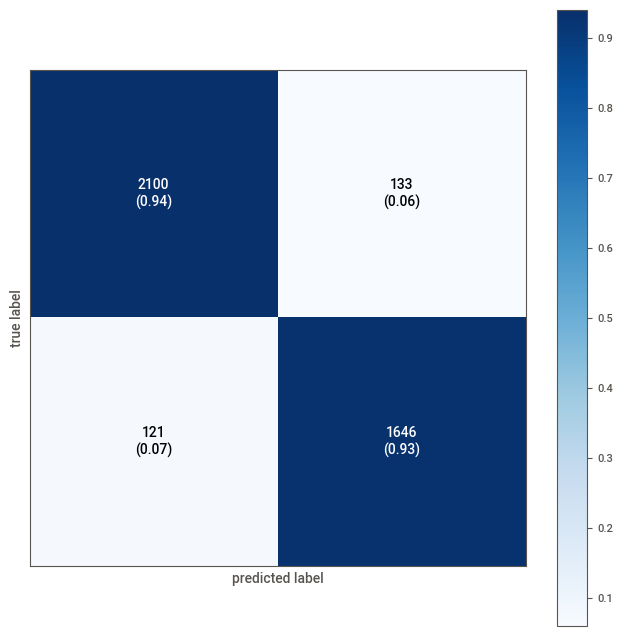

In [41]:
from sklearn.svm import SVC

svm = SVC()
algorithm(svm)

Logistic Regression

Train set score:  0.95575
Test set score:  0.92925
Cross validation score:  0.9346249999999999


,precision,recall,f1-score,support
0,0.941468,0.931818,0.936618,2244
1,0.913997,0.925968,0.919943,1756
accuracy,0.929250,0.929250,0.929250,0
macro avg,0.927732,0.928893,0.928281,4000
weighted avg,0.929408,0.929250,0.929298,4000


Confusion Matrix


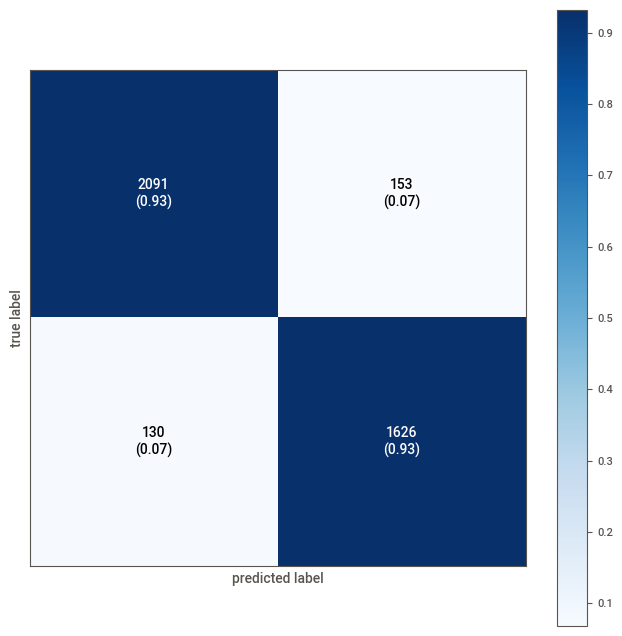

In [42]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
algorithm(lr)

Gradient Boosting Machines

Train set score:  0.954625
Test set score:  0.94
Cross validation score:  0.945


,precision,recall,f1-score,support
0,0.936515,0.954566,0.945455,2179
1,0.944351,0.922570,0.933333,1821
accuracy,0.940000,0.940000,0.940000,0
macro avg,0.940433,0.938568,0.939394,4000
weighted avg,0.940082,0.940000,0.939936,4000


Confusion Matrix


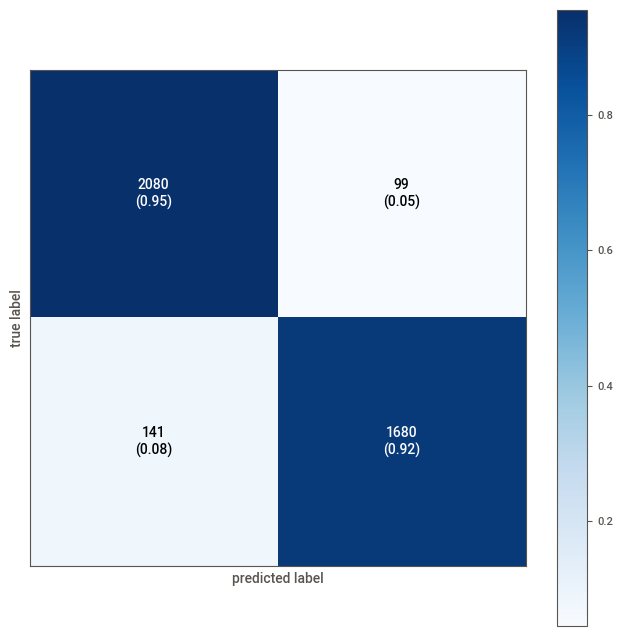

In [43]:
#Gradient Boosting Machines
from sklearn.ensemble import GradientBoostingClassifier
 
gbc = GradientBoostingClassifier()
algorithm(gbc)

Decision Trees

Train set score:  1.0
Test set score:  0.9155
Cross validation score:  0.9132499999999999


,precision,recall,f1-score,support
0,0.926610,0.921630,0.924113,2233
1,0.901630,0.907753,0.904681,1767
accuracy,0.915500,0.915500,0.915500,0
macro avg,0.914120,0.914692,0.914397,4000
weighted avg,0.915575,0.915500,0.915529,4000


Confusion Matrix


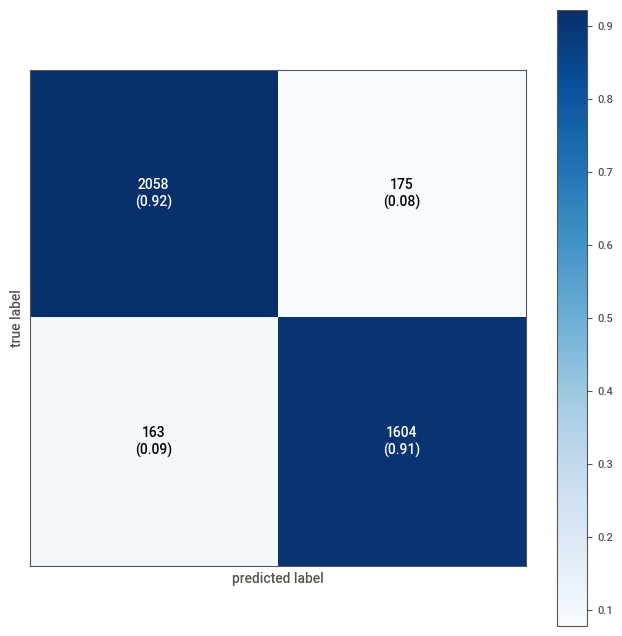

In [44]:
#Decision Trees
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
algorithm(dt)

Gradient Boosting Machines

Train set score:  0.954625
Test set score:  0.94025
Cross validation score:  0.9448124999999999


,precision,recall,f1-score,support
0,0.936965,0.954587,0.945694,2180
1,0.944351,0.923077,0.933593,1820
accuracy,0.940250,0.940250,0.940250,0
macro avg,0.940658,0.938832,0.939643,4000
weighted avg,0.940326,0.940250,0.940188,4000


Confusion Matrix


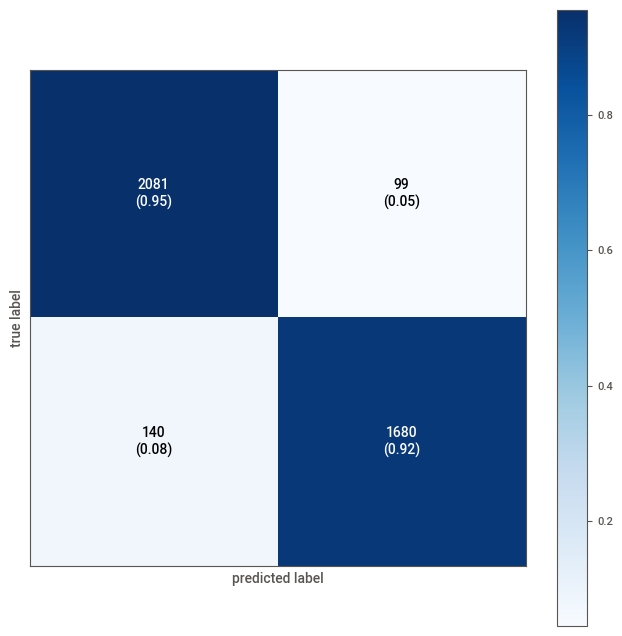

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier()
algorithm(gbc)

In [46]:
Technique = ['GaussianNB','BernoulliNB','MLPClassifier','RandomForestClassifier','XGBClassifier', 'SVC', 'LogisticRegression', 'GradientBoostingClassifier', 'DecisionTreeClassifier', 'GradientBoostingClassifier']
results = pd.DataFrame({'Technique':Technique, 'Train Score':train_score, 'Test Score':test_score, 'Cross Validation':CV})
display(results)

,Technique,Train Score,Test Score,Cross Validation
0,GaussianNB,0.87,0.84,0.85
1,BernoulliNB,0.85,0.83,0.84
2,MLPClassifier,1.00,0.93,0.93
3,RandomForestClassifier,1.00,0.94,0.94
4,XGBClassifier,1.00,0.95,0.96
5,SVC,0.99,0.94,0.95
6,LogisticRegression,0.96,0.93,0.93
7,GradientBoostingClassifier,0.95,0.94,0.94
8,DecisionTreeClassifier,1.00,0.92,0.91
9,GradientBoostingClassifier,0.95,0.94,0.94


Plot for learning curve

Learning Curve for XGBoost
Learning Curve for Bernoulli Naive Bayes
Learning Curve for Gaussian Naive Bayes
Learning Curve for Random Forest Classifier
Learning Curve for Multi Layer Perceptron
Learning Curve for Support Vector Machine
Learning Curve for Logistic Regression
Learning Curve for Gradient Boosting Classifier
Learning Curve for Decision Tree Classifier


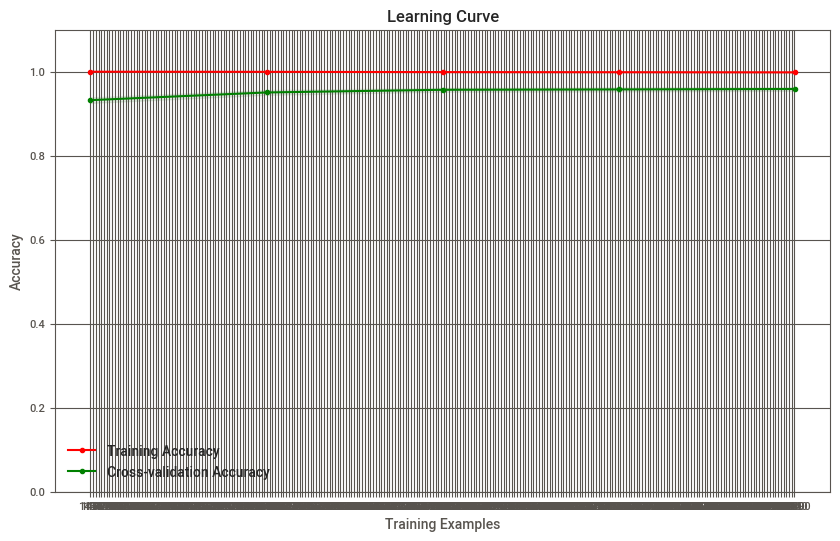

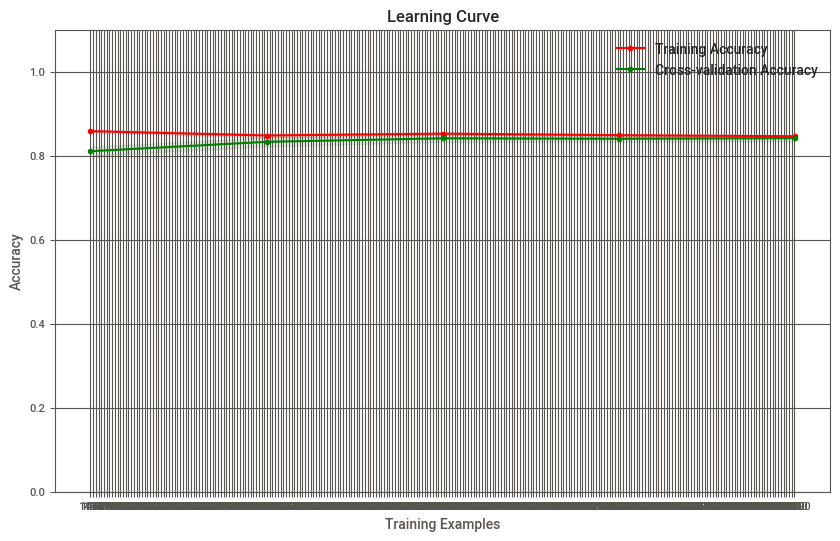

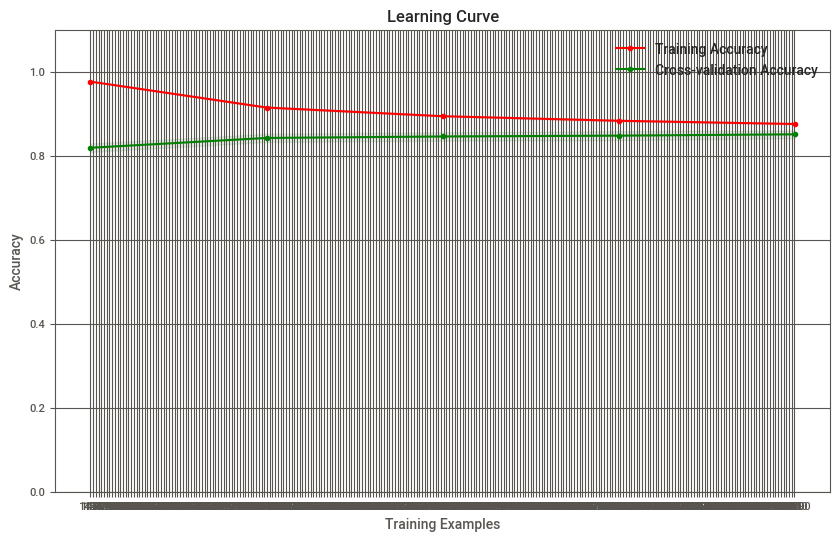

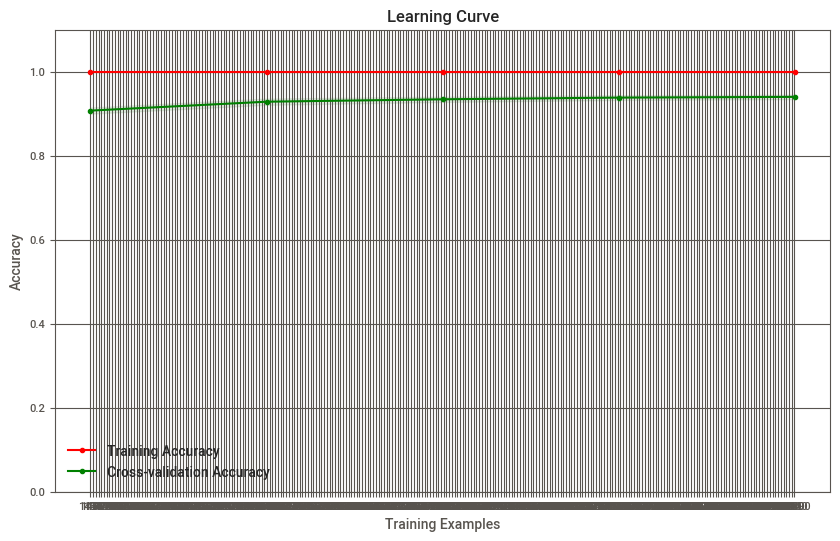

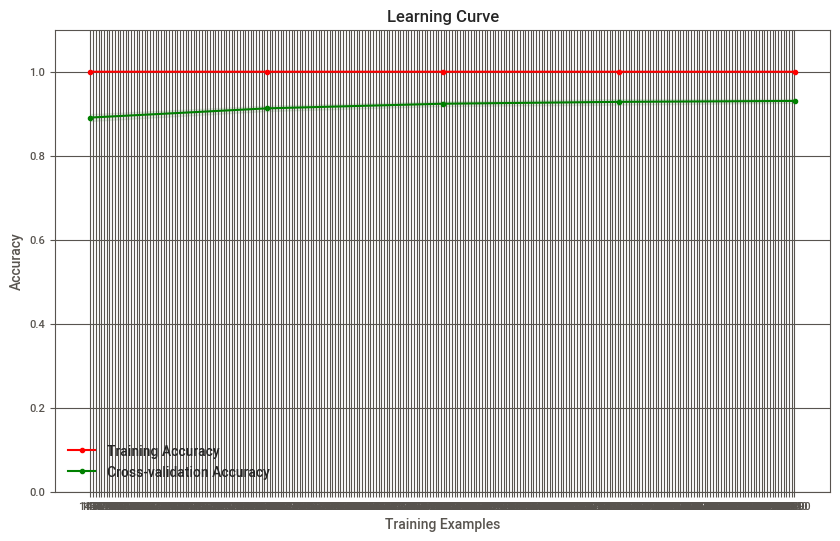

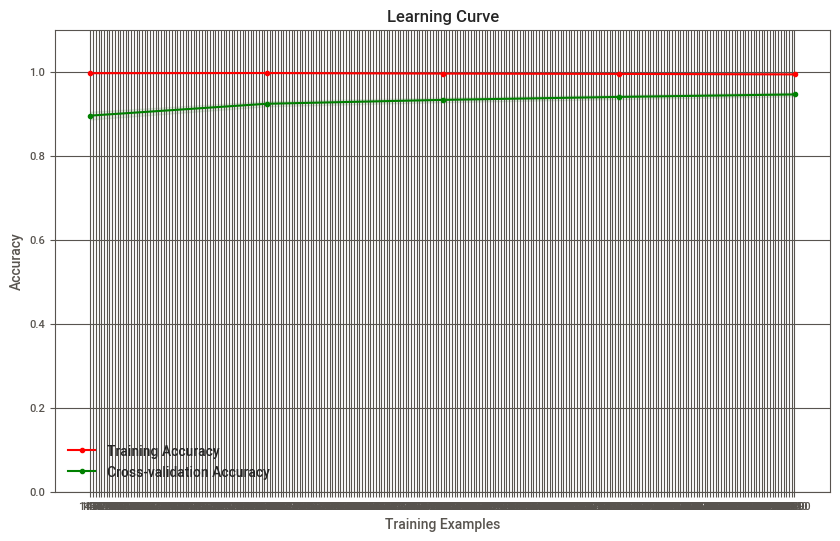

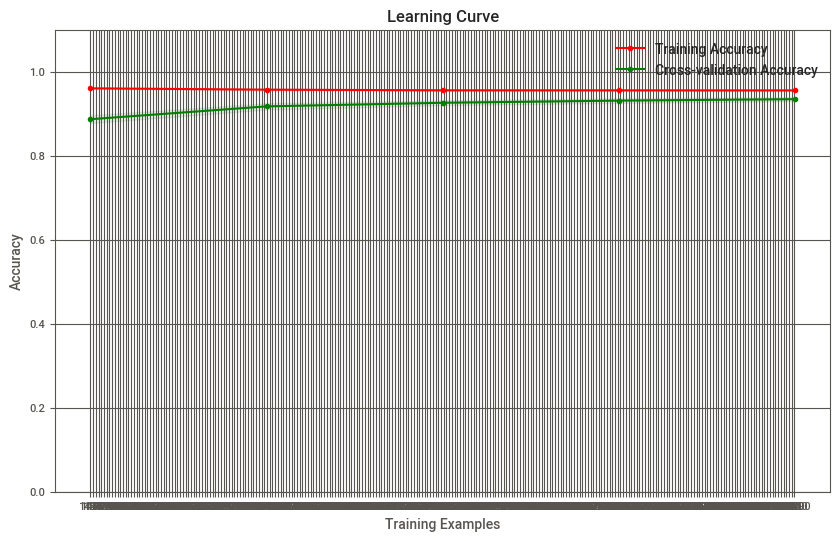

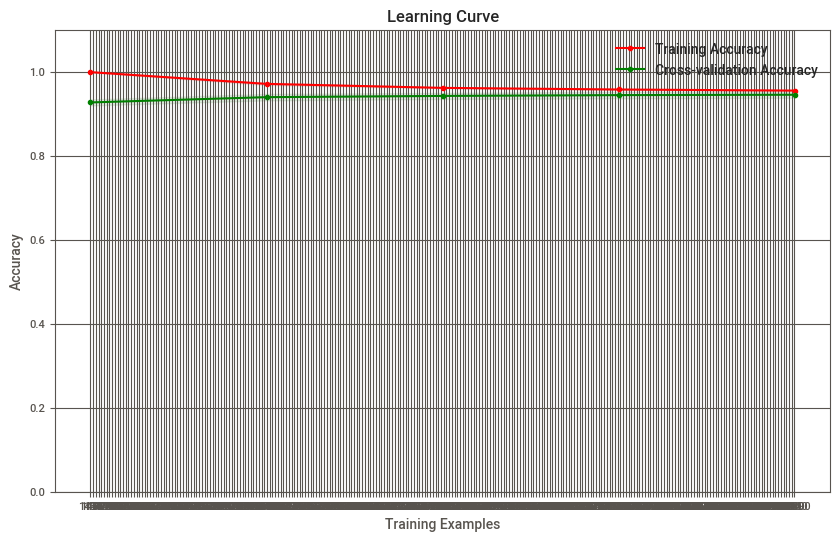

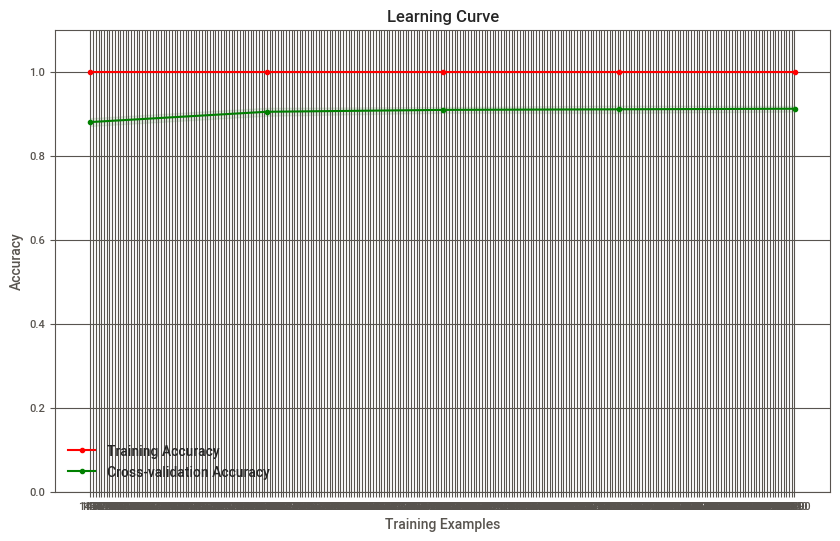

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, X, y, cv=None, train_sizes=np.linspace(0.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object
        The learning estimator
    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and n_features is the number of features.
    y : array-like, shape (n_samples,)
        Target relative to X for classification or regression.
    cv : int, cross-validation generator, optional
        Determines the cross-validation splitting strategy.
    train_sizes : array-like, shape (n_ticks,), dtype float or int
        Relative or absolute numbers of training examples that will be used to generate the learning curve.
    """
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, train_sizes=train_sizes, scoring='accuracy')
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.title("Learning Curve")
    plt.xlabel("Training Examples")
    plt.ylabel("Accuracy")
    plt.ylim(0.0, 1.1)
    plt.xticks(np.arange(min(train_sizes), max(train_sizes)+1, 50))
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Accuracy")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation Accuracy")

    plt.legend(loc="best")
    return plt
print("Learning Curve for XGBoost")
plot_learning_curve(xgb, x_train, y_train, cv=10)
print("Learning Curve for Bernoulli Naive Bayes")
plot_learning_curve(bnv, x_train, y_train, cv=10)
print("Learning Curve for Gaussian Naive Bayes")
plot_learning_curve(gnv, x_train, y_train, cv=10)
print("Learning Curve for Random Forest Classifier")
plot_learning_curve(rf, x_train, y_train, cv=10)
print("Learning Curve for Multi Layer Perceptron")
plot_learning_curve(mlp, x_train, y_train, cv=10)
print("Learning Curve for Support Vector Machine")
plot_learning_curve(svm, x_train, y_train, cv=10)
print("Learning Curve for Logistic Regression")
plot_learning_curve(lr, x_train, y_train, cv=10)
print("Learning Curve for Gradient Boosting Classifier")
plot_learning_curve(gbc, x_train, y_train, cv=10)
print("Learning Curve for Decision Tree Classifier")
plot_learning_curve(dt, x_train, y_train, cv=10)
plt.show()


Saving Model and Vectorizer

In [47]:
from joblib import dump

#save the models as joblib file
dump(gnv, 'model/gnv.joblib')
dump(bnv, 'model/bnv.joblib')
dump(mlp, 'model/mlp.joblib')
dump(rf, 'model/rf.joblib')
dump(xgb, 'model/xgb.joblib')
dump(svm, 'model/svm.joblib')
dump(lr, 'model/lr.joblib')
dump(gbc, 'model/gbc.joblib')
dump(dt, 'model/dt.joblib')

#save tfidf vectorizer as joblib file
dump(tfidf, 'vectorizer/tfidf.joblib')

['vectorizer/tfidf.joblib']